# Исследование рынка заведений общественного питания Москвы

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. 

**Наша цель** — подготовить исследование рынка Москвы, найти интересные особенности, которые в будущем помогут в выборе подходящего инвесторам места.

**План работы**

- ознакомимся с данными, проведем их предобработку;
- исследуем количество объектов общественного питания по категориям, посмотрим их распределение;
- проанализируем количество посадочных мест в местах по категориям;
- рассмотрим соотношение сетевых и несетевых заведений;
- найдем топ-15 популярных сетей в Москве;
- исследуем количество заведений каждой категории по районам;
- посмотрим распределение средних рейтингов по категориям заведений;
- построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района;
- отобразим все заведения на карте с помощью кластеров;
- найдем топ-15 улиц по количеству заведений;
- посмотрим улицы, на которых находится только один объект общепита, проанализируем что можно сказать об этих заведениях;
- исследуем средний чек заведений по районам.

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуем определить, осуществима ли мечта клиентов.

- посмотрим особенности расположения кофеен;
- проанализируем график работы кофеен;
- изучим рейтинг кофеен по районам;
- рассмотрим на какую стоимость чашки капучино стоит ориентироваться;
- исследуем средний чек кофеен по районам;
- посмотрим количество посадочных мест в кофейнях;
- сформулируем рекомендации по открытию кофейни.

**Описание данных**

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
«Средний счёт: 1000–1500 ₽»;
«Цена чашки капучино: 130–220 ₽»;
«Цена бокала пива: 400–600 ₽».
и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
0 — заведение не является сетевым
1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Ознакомление с данными

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

from matplotlib import pyplot as plt

import plotly.express as px
from plotly import graph_objects as go 

import json
from folium import Map, Choropleth

import matplotlib 
matplotlib.style.use('seaborn-pastel')

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
#напишем функцию для первоначального анализа и ознакомимся с данными 

def info(df):
    display(df.head())
    print(df.isna().sum())
    print(df.duplicated().sum())
    print(df.info())

In [4]:
info(data)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64
0
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-n

Изучив общую информацию о датасете, мы видим, что представлено 8406 заведений. Есть пропуски в столбцах с информацией о графике работы, категории цен, среднем чеке, об оценке среднего чека и количестве посадочных мест. Явных дубликатов нет. В датасете представлены значения с плавающей точкой, целого типа и значения типа object.

## Предобработка данных

In [5]:
#проверим на неявные дубликаты

data['name'] = data['name'].str.lower()
data[data.duplicated(subset=['name', 'address'], keep = False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [6]:
#удалим дубликаты

data.drop_duplicates(subset=['name', 'address'], keep = False, inplace = True)

Количество пропусков в столбцах с категорией цен, средним чеком, оценкой среднего чека и стоимости чашки кофе очень много, поэтому если заполнить их медианным или средним занчением в зависимости от района, например, или принадлежности к сети, это значительно повлияет на данные, оставим их как есть. Пропуски по графику работы мы никак не заполним, тоже касается и количества посадочных мест, но и удалять их не стоит чтобы не исказить анализ.

In [7]:
#создадим столбец street с названиями улиц из столбца с адресом

data['street'] = data['address'].str.split(',').str[1]

In [8]:
#создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно 

data['is_24/7'] = data['hours'].str.contains('ежедневно, круглосуточно')

## Анализ данных

### Распределение заведений по категориям

In [9]:
#исследуем количество объектов общественного питания по категориям

data_category = data.pivot_table(index='category', values = 'name', aggfunc = 'count').sort_values(by='name', ascending=False).reset_index()
fig = px.bar(data_category, x='category', y='name', title='Количество объектов общественного питания по категориям', labels={'category': 'Категории' ,'name': 'Количество заведений'})
fig.show() 

Таким образом, лидируют кафе и рестораны (2369 и 2033 заведений), на кофейни приходится тоже значительный кусок (1408 заведений), а меньше всего столовых и булочных (314 и 255 заведений).

###  Количество посадочных мест в заведениях по категориям

In [10]:
#Исследуем количество посадочных мест в местах по категориям

data.groupby('category')['seats'].describe() 

,count,mean,std,min,25%,50%,75%,max
category,,,,,,,,
"бар,паб",467.0,124.477516,145.162278,0.0,48.0,82.0,148.5,1288.0
булочная,147.0,88.115646,96.787050,0.0,25.0,50.0,120.0,625.0
быстрое питание,349.0,98.891117,106.611739,0.0,28.0,65.0,140.0,1040.0
кафе,1217.0,97.365653,117.922464,0.0,35.0,60.0,120.0,1288.0
кофейня,751.0,111.199734,127.837772,0.0,40.0,80.0,144.0,1288.0
пиццерия,427.0,94.496487,112.282703,0.0,30.0,55.0,120.0,1288.0
ресторан,1267.0,121.817680,123.873486,0.0,48.0,86.0,150.0,1288.0
столовая,164.0,99.750000,122.951453,0.0,40.0,75.5,117.0,1200.0


In [11]:
#посмотрим какой процент заведений с аномальным числом посадочных мест

np.nanpercentile(data['seats'], [90, 95, 99])

array([240., 307., 625.])

Заведения более 625 посадочных мест составляют 1% исследуемых данных, отбросим их.

In [12]:
data = data.query('seats <= 625 | seats.isna()')

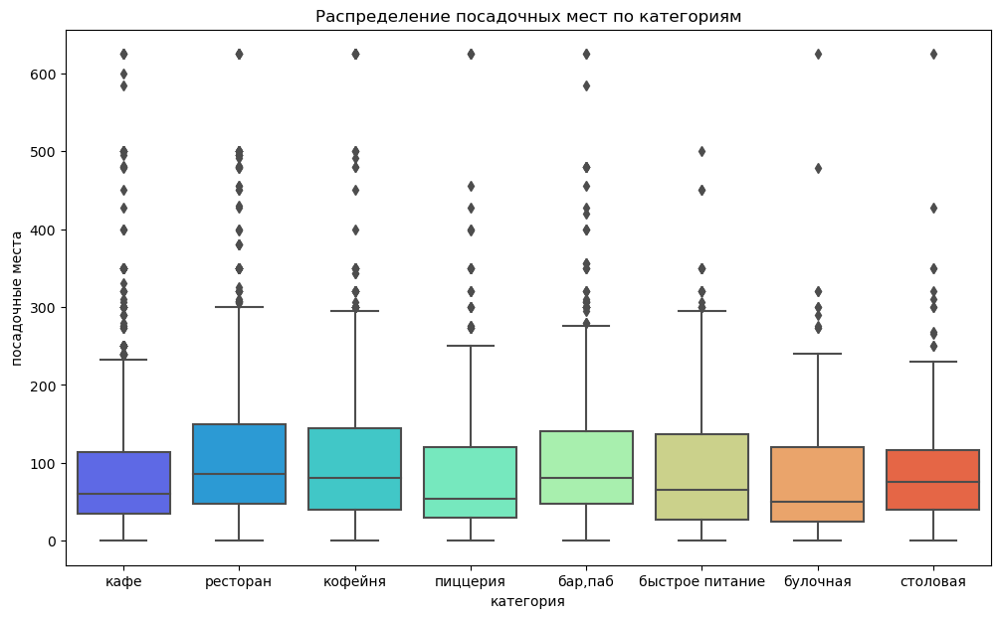

In [13]:
#посмотрим на распределение данных 

plt.figure(figsize=(12, 7))
ax = sns.boxplot(x='category', y='seats', data=data, palette='rainbow') 
ax.set(xlabel='категория', ylabel='посадочные места', title='Распределение посадочных мест по категориям')
plt.show()

Судя по графику распределения количества посадочных мест во всех категориях заведений есть значительные выбросы, поэтому для дальнейшего исследования будем ориентироваться на медиану.

In [14]:
data.groupby('category')['seats'].median().sort_values(ascending=False) 

category
ресторан           86.0
бар,паб            80.0
кофейня            80.0
столовая           75.0
быстрое питание    65.0
кафе               60.0
пиццерия           53.5
булочная           50.0
Name: seats, dtype: float64

Больше всего посадочных мест в ресторанах, далее идут бары и кофейни, меньше всего в булочных и пиццериях.

###  Соотношение сетевых и несетевых заведений

In [15]:
#столбец с меткой о сети заменим на более читаемый

data['chain'] = data['chain'].apply(lambda x: 'сетевые' if x == 1 else 'несетевые')

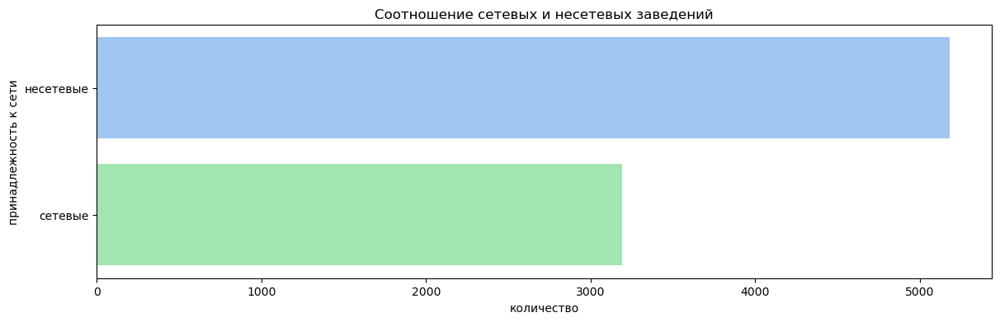

In [16]:
#рассмотрим соотношение сетевых и несетевых заведений

chain = data.groupby('chain').agg({'name':'count'}).reset_index()
plt.figure(figsize=(14, 4)) 
plt.title('Соотношение сетевых и несетевых заведений')
sns.barplot(x='name', y='chain', data=chain).set(xlabel='количество', ylabel='принадлежность к сети')
plt.show()

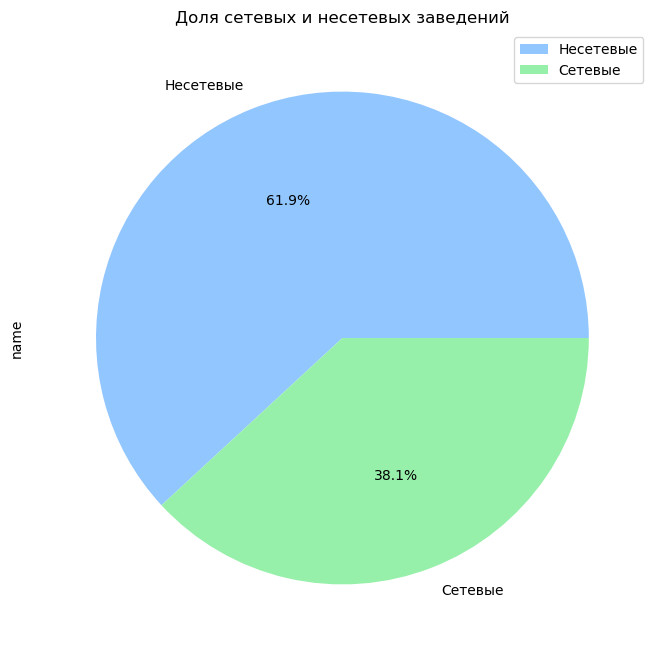

In [17]:
#посмотрим какую долю составляют несетевые заведения

chain.plot(y="name", kind="pie", figsize=(8, 8), autopct='%1.1f%%', labels=['Несетевые', 'Сетевые'])
plt.title('Доля сетевых и несетевых заведений')
plt.show()

Большая часть - почти 62% приходится на несетевые заведения.

In [18]:
#исследуем какая доля несетевых заведений по категориям

data_chain_ratio = data.pivot_table(index = 'category', columns = 'chain', values = 'name', aggfunc = 'count')
data_chain_ratio['всего'] = data_chain_ratio['несетевые']+data_chain_ratio['сетевые']
data_chain_ratio['%_несетевых'] = (data_chain_ratio['несетевые'] / data_chain_ratio['всего']).round(2)
data_chain_ratio = data_chain_ratio.sort_values(by='%_несетевых', ascending=False)
display(data_chain_ratio)

chain,несетевые,сетевые,всего,%_несетевых
category,,,,
"бар,паб",589,168,757,0.78
столовая,226,88,314,0.72
кафе,1592,777,2369,0.67
ресторан,1308,725,2033,0.64
быстрое питание,371,231,602,0.62
кофейня,691,717,1408,0.49
пиццерия,303,329,632,0.48
булочная,99,156,255,0.39


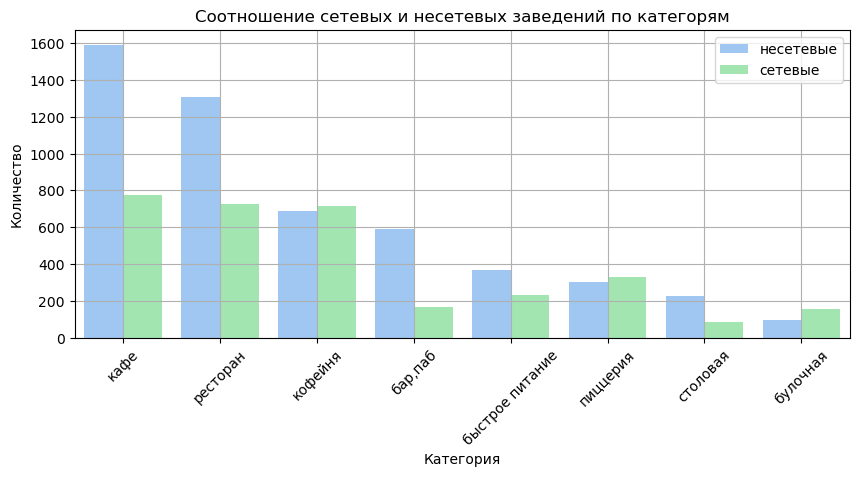

In [19]:
#построим график соотношения сетевых и несетевых заведений по категориям

chain_cat = data.groupby(['category', 'chain'], \
                        as_index = False)[['name']].count().sort_values(by='name', ascending = False) 

plt.figure(figsize=(10, 4))

sns.barplot(x='category', y='name', data=chain_cat, hue='chain')

plt.title('Соотношение сетевых и несетевых заведений по категорям')
plt.xlabel('Категория')
plt.ylabel('Количество')
plt.xticks(rotation=45)
plt.legend(loc='upper right', fontsize=10)
plt.grid()
plt.show()

Таким образом, в категориях кафе, ресторан, бар/паб, быстрое питание и столовая количество несетевых заведений значительно превышает сетевые, а вот в категорях кофейня, пицерия и булочная, наоборот чуть больше сетевых.

###  Топ-15 популярных сетей в Москве

In [20]:
#сформируем датасет с сетевыми заведениями

chains = data.query('chain == "сетевые"')

#определим топ-15 полулярных сетей

top15_chains = chains.groupby('name').agg({'name':'count'})
top15_chains.rename(columns = {'name':'total'}, inplace = True)
top15_chains = top15_chains.sort_values(by='total', ascending = False).head(15).reset_index()
top15_chains

,name,total
0,шоколадница,118
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,70
4,яндекс лавка,68
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


In [21]:
fig = px.bar(top15_chains, x='name', y='total', title='Топ-15 популярных сетей в Москве', labels={'name': 'Наименование сети' ,'total': 'Количество заведений сети'})
fig.show()

Самые популярные сети это: шоколадница, далее идут домино'с пицца и додо пицца, завершают топ-15 буханка и му-му.

In [22]:
#посмотрим к какой категории заведений они относятся

list = top15_chains['name'].unique()

top15_chains_data = chains.query('name in @list')
top15_chains_cat = top15_chains_data.groupby(['name', 'category']).agg({'name':'count'})
top15_chains_cat

name
name                                category             
cofefest                            кафе                1
                                    кофейня            31
cofix                               кофейня            65
one price coffee                    кофейня            70
prime                               кафе                1
                                    ресторан           49
буханка                             булочная           25
                                    кафе                1
                                    кофейня             6
додо пицца                          пиццерия           74
домино'с пицца                      пиццерия           76
кофепорт                            кофейня            42
кулинарная лавка братьев караваевых кафе               39
му-му                               бар,паб             1
                                    быстрое питание     2
                                    кафе               12
                                    кофейня             2
                                    пиццерия            1
                                    ресторан            8
                                    столовая            1
теремок                             быстрое питание     2
                                    ресторан           36
хинкальная                          бар,паб             3
                                    быстрое питание     6
                                    кафе               19
                                    ресторан           15
                                    столовая            1
чайхана                             быстрое питание     2
                                    кафе               26
                                    ресторан            9
шоколадница                         кафе                1
                                    кофейня           117
яндекс лавка                        ресторан           68

Рассмортрим какой признак может объединять самые популярные сети. 

In [23]:
top15_chains_data

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
13,буханка,булочная,"Москва, Базовская улица, 15, корп. 1",Северный административный округ,"ежедневно, 08:00–22:00",55.877007,37.504980,4.8,NaN,NaN,NaN,NaN,сетевые,180.0,Базовская улица,False
23,буханка,булочная,"Москва, Лобненская улица, 13к2",Северный административный округ,"ежедневно, 08:00–22:00",55.888421,37.527106,4.7,NaN,NaN,NaN,NaN,сетевые,NaN,Лобненская улица,False
32,додо пицца,пиццерия,"Москва, Коровинское шоссе, 23, корп. 1",Северный административный округ,"ежедневно, 09:00–23:00",55.877388,37.523334,4.3,NaN,Средний счёт:328 ₽,328.0,NaN,сетевые,46.0,Коровинское шоссе,False
34,домино'с пицца,пиццерия,"Москва, Клязьминская улица, 11, корп. 4",Северный административный округ,"ежедневно, 10:00–23:00",55.886963,37.523518,4.2,NaN,Средний счёт:от 500 ₽,500.0,NaN,сетевые,247.0,Клязьминская улица,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевые,NaN,улица Маршала Федоренко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7973,теремок,ресторан,"Москва, Ореховый бульвар, 15",Южный административный округ,"ежедневно, 10:00–22:00",55.612758,37.720272,3.7,NaN,NaN,NaN,NaN,сетевые,0.0,Ореховый бульвар,False
7974,хинкальная,ресторан,"Москва, улица Генерала Белова, 23А",Южный административный округ,"ежедневно, 12:00–00:00",55.616224,37.719993,3.6,NaN,NaN,NaN,NaN,сетевые,60.0,улица Генерала Белова,False
7979,яндекс лавка,ресторан,"Москва, Шипиловский проезд, 65, корп. 1",Южный административный округ,"ежедневно, 07:00–00:00",55.599020,37.714239,3.5,NaN,NaN,NaN,NaN,сетевые,75.0,Шипиловский проезд,False
7980,яндекс лавка,ресторан,"Москва, улица Маршала Захарова, 2",Южный административный округ,"ежедневно, 07:00–00:00",55.624112,37.707183,4.0,NaN,NaN,NaN,NaN,сетевые,200.0,улица Маршала Захарова,False


Заведения относятся к разным категориям, находятся в разных районах, имеют различный рейтинг, посмотрим в каком ценовом диапазоне они работают.

In [24]:
top15_chains_data.groupby('price').agg({'name':'count'})

,name
price,
высокие,2
выше среднего,6
низкие,23
средние,209


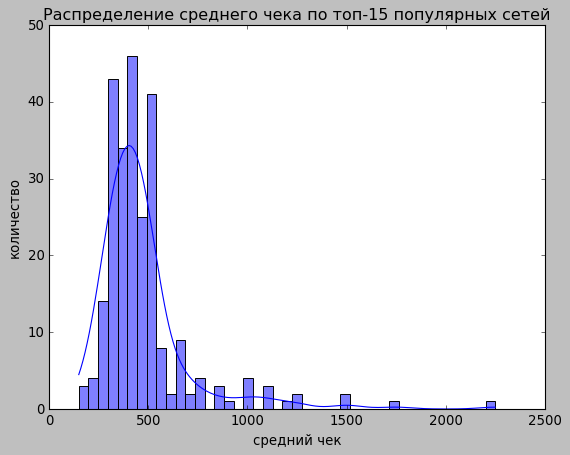

In [25]:
#построим график распределения среднего чека по топ-15

plt.style.use('classic')
sns.histplot(x='middle_avg_bill', data=top15_chains_data, kde=True).set(xlabel='средний чек', ylabel='количество', title='Распределение среднего чека по топ-15 популярных сетей')
plt.show()

Можем предположить что общим признаком является низкий средний чек для популярных сетевых заведений. 

###  Количество заведений каждой категории по административным районам

In [26]:
#рассмотрим какие административные районы Москвы есть в датасете

data['district'].unique()

array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [27]:
#сформируем сводную таблицу по категориям и районам

data_district = data.pivot_table(index='district', columns ='category', values = 'name', aggfunc = 'count')
data_district

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
district,,,,,,,,
Восточный административный округ,50,25,70,270,104,72,160,40
Западный административный округ,46,36,62,233,146,70,213,23
Северный административный округ,68,39,58,235,193,77,187,41
Северо-Восточный административный округ,62,28,82,269,159,68,181,40
Северо-Западный административный округ,23,12,30,115,62,40,109,18
Центральный административный округ,364,50,87,464,428,113,670,66
Юго-Восточный административный округ,38,13,67,282,89,55,145,25
Юго-Западный административный округ,38,27,61,237,96,64,167,17
Южный административный округ,68,25,85,264,131,73,201,44


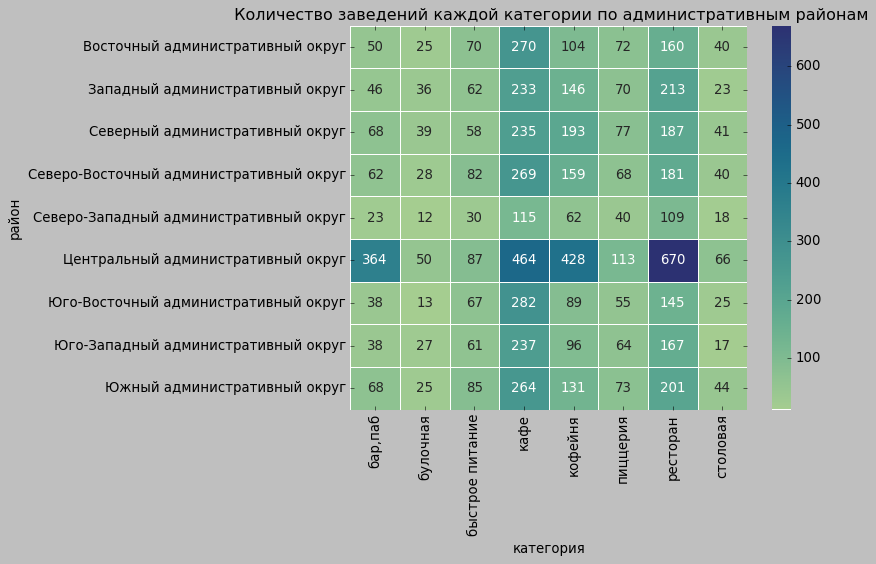

In [28]:
#построим тепловую карту

sns.heatmap(data_district, cmap='crest', annot=True, fmt=".3g", linewidth=.5).set(xlabel='категория', ylabel='район')
plt.title(' Количество заведений каждой категории по административным районам')
plt.show()

Вывод: больше всего заведений в центральном административном округе, а меньше всего в северо-западном. По остальным районам в среднем заведения распределены равномерно.

###  Распределение средних рейтингов по категориям заведений

In [29]:
#рассчитаем средний рейтинг заведений по категориям

data_rating = data.groupby('category').agg({'rating':'mean'}).round(2).sort_values('rating', ascending=False).reset_index()
data_rating

,category,rating
0,"бар,паб",4.39
1,пиццерия,4.30
2,ресторан,4.29
3,кофейня,4.28
4,булочная,4.27
5,столовая,4.21
6,кафе,4.12
7,быстрое питание,4.05


In [30]:
#построим график

fig = px.bar(data_rating, x='rating', y='category', text='rating', color='category')
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                  xaxis_title='Рейтинг',
                  yaxis_title='Категория')
fig.show()

Таким образом, самый высокий средний рейтинг у баров/пабов, а самый низкий у кафе быстрого питания. В целом значения усредненного рейтинга не сильно различаются в разных типах общепита.

###  Фоновая картограмма (хороплет) со средним рейтингом заведений каждого района

In [31]:
#рассчитаем средний рейтинг заведений по районам

data_district_rating = data.groupby('district').agg({'rating':'mean'}).round(2).reset_index()
data_district_rating

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [32]:
#загруpзим файл с границами районов Москвы

state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson' 
    
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

#создадим карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#создадим хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выведем карту
m

Самый высокий рейтинг у заведений в центре, далее идут севреный и северо-западный районы. Ниже всего рейтинги на юго-востоке.

###  Все заведения датасета на карте с помощью кластеров

In [33]:
# импортируем карту и маркер
from folium import Map, Marker
# импортируем кластер
from folium.plugins import MarkerCluster

# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

###  Топ-15 улиц по количеству заведений

In [34]:
#определим топ-15 улиц по количеству заведений

top15_streets = data.groupby('street').agg({'name':'count'})
top15_streets.rename(columns = {'name':'total'}, inplace = True)
top15_streets = top15_streets.sort_values(by='total', ascending = False).head(15).reset_index()
top15_streets

,street,total
0,проспект Мира,182
1,Профсоюзная улица,122
2,Ленинский проспект,107
3,проспект Вернадского,97
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


In [35]:
#определим к каким категориям относятся заведения на этих улицах

list = top15_streets['street'].unique()

top15_streets_data = data.query('street in @list')
top15_streets_cat = top15_streets_data.groupby(['street', 'category']).agg({'name':'count'}).reset_index()
top15_streets_cat

,street,category,name
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,18
3,Варшавское шоссе,кофейня,14
4,Варшавское шоссе,пиццерия,4
...,...,...,...
106,улица Миклухо-Маклая,быстрое питание,4
107,улица Миклухо-Маклая,кафе,20
108,улица Миклухо-Маклая,кофейня,4
109,улица Миклухо-Маклая,пиццерия,2


In [36]:
#построим график

fig = px.bar(top15_streets_cat, x='name', y='street', color='category')
fig.update_layout(title='Распределение количества заведений и их категорий по улицам топ-15',
                  xaxis_title='Количество',
                  yaxis_title='Улица')
fig.show()

Лидирует по количеству заведений Проспект мира, на котором больше всего кафе, ресторанов и кофеен, завершает список топ-15 улица Миклухо-Маклая, где также лидируют кафе и рестораны.

###  Улицы, на которых находится только один объект общепита

In [37]:
#найдем улицы с 1 заведением

streets = data.groupby('street').agg({'name':'count'})
one_street = streets.query('name == 1').reset_index()
one_street

,street,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
4,1-й Голутвинский переулок,1
...,...,...
453,улица Шкулёва,1
454,улица Шкулёва 4,1
455,улица Шухова,1
456,улица Юннатов,1


In [38]:
#отфильтруем датасет по этим улицам

list_one = one_street['street'].unique()
one_street_data = data.query('street in @list_one').reset_index()
one_street_data

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,несетевые,180.0,улица Бусиновская Горка,False
1,21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,Прибрежный проезд,False
2,25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк Левобережный,False
3,58,coffeekaldi's,кофейня,"Москва, Угличская улица, 13, стр. 8",Северо-Восточный административный округ,"ежедневно, 09:00–22:00",55.900316,37.570558,4.1,средние,Средний счёт:500–800 ₽,650.0,NaN,сетевые,NaN,Угличская улица,False
4,60,чебуречная история,кофейня,"Москва, ландшафтный заказник Лианозовский",Северо-Восточный административный округ,"ежедневно, 10:00–22:00",55.899845,37.570488,4.9,NaN,NaN,NaN,NaN,сетевые,NaN,ландшафтный заказник Лианозовский,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
453,8289,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,несетевые,90.0,улица Шкулёва,False
454,8294,wtfcoffee,кофейня,"Москва, улица Артюхиной, 14/8с1",Юго-Восточный административный округ,"ежедневно, 10:00–22:00",55.699044,37.737790,4.4,средние,NaN,NaN,NaN,несетевые,NaN,улица Артюхиной,False
455,8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,сетевые,NaN,Кузьминская улица,False
456,8379,лагман хаус,кафе,"Москва, Новороссийская улица, 14, стр. 2",Юго-Восточный административный округ,"ежедневно, 10:00–00:00",55.678772,37.759422,4.3,NaN,NaN,NaN,NaN,сетевые,40.0,Новороссийская улица,False


In [39]:
#посмотрим к каким категориям относятся заведения на таких улицах

one_street_data.groupby('category').agg({'name':'count'}).sort_values(by='name', ascending=False)

,name
category,
кафе,160
ресторан,93
кофейня,84
"бар,паб",39
столовая,36
быстрое питание,23
пиццерия,15
булочная,8


In [40]:
#соотношение сетевых и несетевых

one_street_data.groupby('chain').agg({'name':'count'})

,name
chain,
несетевые,325
сетевые,133


Вывод: на улицах с одним заведением больше всего кафе, и большая часть заведений несетевые. Можем предположить, что данные улицы являются короткими, поэтому на них находится всего по 1му заведению. Посмотрим по карте.

In [41]:
# создаём карту Москвы
m_s = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_s)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
one_street_data.apply(create_clusters, axis=1)

# выводим карту
m_s

Действительно, большинство улиц с одним заведением это маленькие переулки, аллеи и проезды.

###  Средний чек заведений по районам

In [42]:
#посчитаем медиану среднего чека для каждого района

price_indicator = data.groupby('district').agg({'middle_avg_bill':'median'}).reset_index()
price_indicator

,district,middle_avg_bill
0,Восточный административный округ,550.0
1,Западный административный округ,1000.0
2,Северный административный округ,650.0
3,Северо-Восточный административный округ,500.0
4,Северо-Западный административный округ,700.0
5,Центральный административный округ,1000.0
6,Юго-Восточный административный округ,450.0
7,Юго-Западный административный округ,600.0
8,Южный административный округ,500.0


In [43]:
#создадим карту Москвы
m_pi = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#создадим хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=price_indicator,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m_pi)

# выведем карту
m_pi

Самый высокий средний чек в центральном и западном районах, а самый низкий в южной и северо-восточной части.

**Общий вывод по третьей части:**

По количеству заведений лидируют кафе и рестораны (2369 и 2033 заведений), на кофейни приходится тоже значительный кусок (1408 заведений), а меньше всего столовых и булочных (314 и 255 заведений). Что касается посадочных мест, то больше всего их в ресторанах, далее идут бары и кофейни, меньше всего в булочных и пиццериях. 

Почти 62% заведений несетевые. Самые популярные сети это: шоколадница, далее идут домино'с пицца и додо пицца, завершают топ-15 буханка и му-му. Общим признаком является низкий средний чек для популярных сетей.

Больше всего заведений в центральном административном округе, а меньше всего в северо-западном. По остальным районам в среднем заведения распределены равномерно.

По категориям самый высокий средний рейтинг у баров/пабов, а самый низкий у кафе быстрого питания. В целом значения усредненного рейтинга не сильно различаются в разных типах общепита. А вот по районам самый высокий рейтинг у заведений в центре, далее идут севреный и северо-западный районы. Ниже всего рейтинги на юго-востоке.

Лидирует по количеству заведений Проспект мира, на котором больше всего кафе, ресторанов и кофеен, завершает список топ-15 улица Миклухо-Маклая, где также лидируют кафе и рестораны. На улицах с одним заведением больше всего кафе, и большая часть заведений несетевые. Большинство улиц с одним заведением это маленькие переулки, аллеи и проезды.

Самый высокий средний чек в центральном и западном районах, а самый низкий в южной и северо-восточной части.

## Открытие кофейни

###  Особенности расположения кофейни

In [44]:
#посмотрим сколько всего кофеен в датасете, в каких районах их больше всего, каковы особенности их расположения

coffee_house = data.query('category == "кофейня"').reset_index()
coffee_house

,index,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,несетевые,NaN,улица Маршала Федоренко,False
1,25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,сетевые,NaN,парк Левобережный,False
2,45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,сетевые,46.0,Коровинское шоссе,False
3,46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,сетевые,NaN,улица Маршала Федоренко,False
4,52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,сетевые,NaN,улица Дыбенко,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1403,8356,назис пури,кофейня,"Москва, Люблинская улица, 61",Юго-Восточный административный округ,"ежедневно, 09:00–22:00",55.684103,37.738588,4.5,NaN,NaN,NaN,NaN,несетевые,NaN,Люблинская улица,False
1404,8365,квадрат кофе,кофейня,"Москва, Волгоградский проспект, 73, стр. 1",Юго-Восточный административный округ,"пн-пт 08:30–21:30; сб,вс 09:00–21:30",55.709710,37.744450,4.2,NaN,Цена чашки капучино:100–220 ₽,NaN,160.0,несетевые,206.0,Волгоградский проспект,False
1405,8376,шоколад имбирь корица,кофейня,"Москва, Грайвороновская улица, 23",Юго-Восточный административный округ,пн-пт 09:30–19:30,55.721213,37.740755,4.1,NaN,NaN,NaN,NaN,несетевые,NaN,Грайвороновская улица,False
1406,8385,cafio,кофейня,"Москва, Новохохловская улица, 49",Юго-Восточный административный округ,"пн-пт 07:00–22:00; сб,вс 07:00–21:00",55.724357,37.716415,4.7,NaN,Цена чашки капучино:80–120 ₽,NaN,100.0,несетевые,NaN,Новохохловская улица,False


In [45]:
coffee_house.groupby('district').agg({'name':'count'}).sort_values(by='name', ascending=False)

,name
district,
Центральный административный округ,428
Северный административный округ,193
Северо-Восточный административный округ,159
Западный административный округ,146
Южный административный округ,131
Восточный административный округ,104
Юго-Западный административный округ,96
Юго-Восточный административный округ,89
Северо-Западный административный округ,62


In [46]:
# создаём карту Москвы
m_ch = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_ch)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house.apply(create_clusters, axis=1)

# выводим карту
m_ch

В датасете всего 1408 кофеен. Большинство располагается в центральном и северном районах, меньше всего на северо-западе и юго-востоке. Часто кофейни находятся возле прогулочных и торговых улиц, парков, образовательных, спортивных учреждений и деловых центров.

###  График работы кофейни

In [47]:
#определим круглосуточные кофейни 'is_24/7' == True

coffee_house.groupby('is_24/7').agg({'name':'count'})

,name
is_24/7,
False,1334
True,59


Количество круглосуточных кофеен всего 59, что в принципе не удивительно, в ночное время данный тип заведения навряд ли будет пользоваться популярностью.

###  Рейтинг кофеен по районам

In [48]:
#найдем средний рейтинг кофеен по районам

coffee_house_rating = coffee_house.groupby('district').agg({'rating':'mean'}).round(2).sort_values('rating', ascending=False).reset_index()

#построим график

fig = px.bar(coffee_house_rating, x='rating', y='district', text='rating', color='district')
fig.update_layout(title='Распределение средних рейтингов кофеен по районам',
                  xaxis_title='Рейтинг',
                  yaxis_title='Район')
fig.show()

Самый высокий рейтинг в центральном и северо-западном районах, самый низкий на западе.

###  Стоимость чашки капучино

In [49]:
#найдем на какую стоимость чашки капучино стоит ориентироваться при открытии

coffee_cup = coffee_house.groupby('district').agg({'middle_coffee_cup':'mean'}).round(2).sort_values(by='middle_coffee_cup', ascending=False).reset_index()
coffee_cup

,district,middle_coffee_cup
0,Западный административный округ,188.56
1,Центральный административный округ,187.52
2,Юго-Западный административный округ,184.18
3,Восточный административный округ,174.02
4,Северный административный округ,165.79
5,Северо-Западный административный округ,165.52
6,Северо-Восточный административный округ,165.33
7,Южный административный округ,158.49
8,Юго-Восточный административный округ,151.09


In [50]:
#рассчитаем среднюю стоимость чашки капучино в кофейнях по всем районам

round(coffee_cup['middle_coffee_cup'].mean(), 2)

171.17

Предлагаем ориентироваться на среднюю стоимость чашки капучино в диапазоне 170 - 190 руб. Клиенты хотят открыть доступную и крутую кофейню и стоит рассмотреть в будущем создание сети кофеен. Как правило ценник одной сети не отличается в зависимости от района и стоимость чашки капучино можно оставить около средней, а дополнительную прибыль извлечь из других товаров. 

###  Средний чек кофеен по районам

In [51]:
coffee_avg_bill = coffee_house.groupby('district').agg({'middle_avg_bill':'median'}).sort_values(by='middle_avg_bill', ascending=False).reset_index()
coffee_avg_bill

,district,middle_avg_bill
0,Западный административный округ,600.0
1,Центральный административный округ,500.0
2,Восточный административный округ,400.0
3,Южный административный округ,387.5
4,Юго-Западный административный округ,375.0
5,Северный административный округ,325.0
6,Северо-Восточный административный округ,325.0
7,Северо-Западный административный округ,325.0
8,Юго-Восточный административный округ,250.0


In [52]:
#создадим карту Москвы
m_cab = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

#создадим хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlGn',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m_cab)

# выведем карту
m_cab

В первую очередь стоит обратить внимание на западный, центральный, восточный и южный районы.

###  Количество посадочных мест

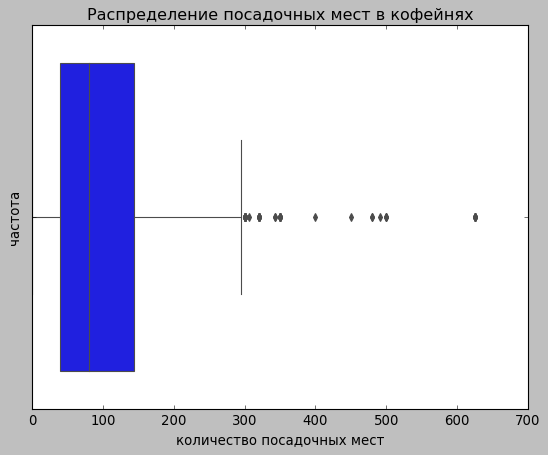

In [53]:
#посмотрим распределение мест по кофейням

sns.boxplot(x=coffee_house['seats']).set(xlabel='количество посадочных мест', ylabel='частота', title='Распределение посадочных мест в кофейнях')
plt.show()

Есть выбросы - кофейни более с чем 300 посадочных мест, посмотрим их количество

In [54]:
np.nanpercentile(coffee_house['seats'], [90, 95, 99])

array([240., 300., 500.])

Таких больших кофеен менее чем 1 %, можем отбросить

In [55]:
coffee_house = coffee_house.query('seats <= 300 | seats.isna()')
coffee_house['seats'].describe() 

count    711.000000
mean      89.658228
std       73.197129
min        0.000000
25%       38.000000
50%       70.000000
75%      120.000000
max      300.000000
Name: seats, dtype: float64

Возьмем за ориентир количество посадочных мест в районе 70.

### Рекомендации

Рекомендуем рассмотреть отрытие кофейни или в дальнейшем открытие сети рядом с парками, прогулочными аллеями, спортивными центрами, образовательными учреждениями и офисными зданиями, а также вблизи скопления большого количества магазинчиков и торговых улиц.  

In [56]:
# подключаем библиотеку
import folium

# сохраняем координаты Филевского парка в переменные
filyovsky_park_lat, filyovsky_park_lng =  55.746911, 37.492098, 
# сохраняем координаты парка Зарядье в переменные
zaryadye_park_lat, zaryadye_park_lng = 55.751065, 37.629019, 

# общий тип мест
place_type = 'Парк'

# создаём карту с центром в точке расположения Филевского парка и начальным зумом 12
mm = folium.Map(location=[filyovsky_park_lat, filyovsky_park_lng],\
               zoom_start=12)
# создаём маркер в точке расположения Филевского парка
# по наведению на точку отобразится «Парк» (tooltip)
# по нажатию на маркер отобразится окно с текстом «Филевский парк»
folium.Marker([filyovsky_park_lat, filyovsky_park_lng],\
              tooltip=place_type,\
              popup='Филевский парк')\
              .add_to(mm)
# создаём маркер в точке расположения парка Зарядье и сразу добавляем на карту
# по наведению на точку отобразится «Парк» (tooltip)
# по нажатию на маркер отобразится окно с текстом «парк Зарядье»
folium.Marker([zaryadye_park_lat, zaryadye_park_lng],\
              tooltip=place_type,
              popup='Парк Зарядье')\
              .add_to(mm)

# выводим карту
mm

**Итоговый вывод**

Для открытия кофейни рекомендуем рассматривать центральный район. 

Не стоит устанавливать круглосуточный режим работы, в ночное время данный тип заведения навряд ли будет пользоваться популярностью. 

Предлагаем ориентироваться на среднюю стоимость чашки капучино в диапазоне 170-190 руб., дополнительную прибыль можно извлечь из других товаров. 

Ориентир по количеству посадочных мест в районе 70. 

Рекомендуем рассмотреть отрытие кофейни или в дальнейшем открытие сети рядом с парками, прогулочными аллеями, спортивными центрами, образовательными учреждениями и офисными зданиями, а также вблизи скопления большого количества магазинчиков и торговых улиц. 

Презентация: https://disk.yandex.ru/i/0uTCxlnHvmfwOA